<a href="https://colab.research.google.com/github/SentaFito53/Invers-Kinematic-3DoF/blob/main/inverse_kinematics_robot_3dof.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🦾 Inverse Kinematics Planar Robot 3-DOF
## Pendekatan Machine Learning, Deep Learning, dan Reinforcement Learning

---
> **Prasyarat:** Python, NumPy, dasar ML & Neural Network  
> **Tools:** `numpy`, `matplotlib`, `scikit-learn`, `torch`, `gymnasium`, `stable-baselines3`


---
## 📖 Bagian 1: Pengantar Forward & Inverse Kinematics

### Apa itu Kinematika Robot?

**Forward Kinematics (FK):** Diberikan sudut sendi → hitung posisi end-effector  
- Mudah ✅, solusi **unik**

**Inverse Kinematics (IK):** Diberikan posisi target → hitung sudut sendi  
- Sulit ⚠️, solusi bisa **banyak** atau **tidak ada**

### Robot Planar 3-DOF
- 3 link (lengan): `L1=0.4m`, `L2=0.3m`, `L3=0.2m`
- 3 sendi (joint): `θ1, θ2, θ3` (dalam radian)
- End-effector: ujung lengan ke-3

### Persamaan FK:
```
x = L1·cos(θ1) + L2·cos(θ1+θ2) + L3·cos(θ1+θ2+θ3)
y = L1·sin(θ1) + L2·sin(θ1+θ2) + L3·sin(θ1+θ2+θ3)
```

### 3 Pendekatan IK dengan AI:
| Pendekatan | Metode | Kelebihan |
|------------|--------|-----------|
| **ML** | Supervised (KNN, RF, SVR) | Cepat, mudah dipahami |
| **DL** | Neural Network (PyTorch) | Akurat, generalisasi baik |
| **RL** | Gymnasium + PPO | Adaptif, bisa dapat obstacle |


---
## 🛠️ Bagian 2: Setup & Visualisasi Robot

In [69]:
# Install dependencies (jalankan sekali)
!pip install gymnasium stable-baselines3 scikit-learn torch matplotlib numpy tqdm
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Circle
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

print("✅ Library siap!")


✅ Library siap!


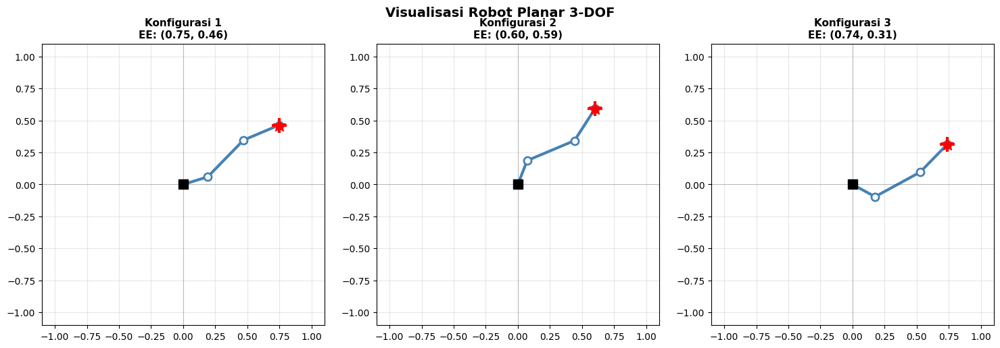

✅ Robot berhasil divisualisasi!


In [70]:
# ─── Konfigurasi Robot ───────────────────────────────────────────────
L1, L2, L3 = 0.2, 0.4, 0.3       # panjang link (meter)
LINK_LENGTHS = np.array([L1, L2, L3])
JOINT_LIMIT  = np.pi              # ±π radian per sendi
MAX_REACH    = L1 + L2 + L3       # 0.9 m

def forward_kinematics(theta):
    """Hitung posisi setiap sendi dari sudut theta = [θ1, θ2, θ3]."""
    t1, t2, t3 = theta
    # Posisi setiap sendi
    p0 = np.array([0.0, 0.0])
    p1 = p0 + L1 * np.array([np.cos(t1), np.sin(t1)])
    p2 = p1 + L2 * np.array([np.cos(t1+t2), np.sin(t1+t2)])
    p3 = p2 + L3 * np.array([np.cos(t1+t2+t3), np.sin(t1+t2+t3)])
    return p0, p1, p2, p3

def get_end_effector(theta):
    """Langsung return posisi end-effector (p3)."""
    return forward_kinematics(theta)[3]

# ─── Fungsi Plot Robot ────────────────────────────────────────────────
def plot_robot(ax, theta, target=None, title="Robot", color='steelblue'):
    p0, p1, p2, p3 = forward_kinematics(theta)
    points = np.array([p0, p1, p2, p3])
    ax.plot(points[:,0], points[:,1], '-o', color=color,
            linewidth=3, markersize=8, markerfacecolor='white',
            markeredgecolor=color, markeredgewidth=2)
    ax.plot(*p0, 'ks', markersize=10)   # base
    ax.plot(*p3, '*', color='red', markersize=14, label='End-effector')
    if target is not None:
        ax.plot(*target, 'r+', markersize=16, markeredgewidth=3, label='Target')
        ax.add_patch(Circle(target, 0.02, color='red', alpha=0.3))
    ax.set_xlim(-1.1, 1.1); ax.set_ylim(-1.1, 1.1)
    ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.axhline(0, color='k', lw=0.5, alpha=0.3)
    ax.axvline(0, color='k', lw=0.5, alpha=0.3)

# ─── Demo Visualisasi Robot ───────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
configs = [
    ([0.3, 0.5, -0.4], "Konfigurasi 1"),
    ([1.2, -0.8, 0.6], "Konfigurasi 2"),
    ([-0.5, 1.0, 0.3], "Konfigurasi 3"),
]
for ax, (theta, title) in zip(axes, configs):
    ee = get_end_effector(theta)
    plot_robot(ax, theta, target=ee, title=f"{title}\nEE: ({ee[0]:.2f}, {ee[1]:.2f})")

plt.suptitle("Visualisasi Robot Planar 3-DOF", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
print("✅ Robot berhasil divisualisasi!")


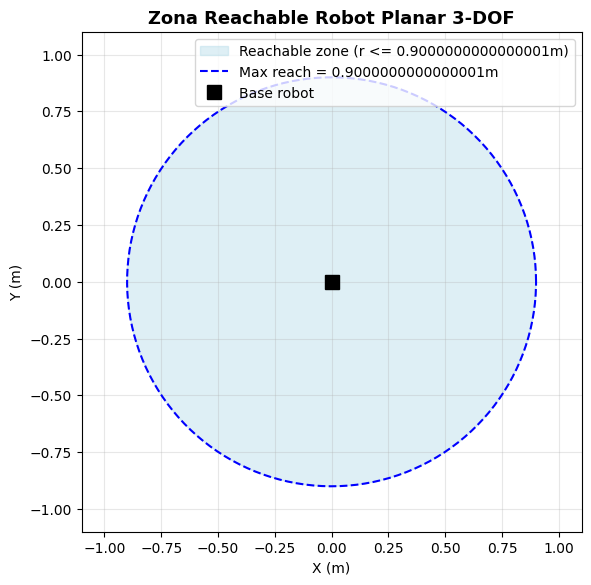

Demo Reachability Check:
  Target               | Jarak    | Reachable?
  ---------------------------------------------
  (0.5, 0.3)             | 0.5831 m | YES
  (0.8, 0.6)             | 1.0000 m | NO
  (1.0, 0.0)             | 1.0000 m | NO
  (1.1, 0.0)             | 1.1000 m | NO
  (0.0, 0.0)             | 0.0000 m | NO


In [71]:
# ─── Fungsi Reachability Check ───────────────────────────────────────
def is_reachable(target, tol=1e-6):
    """
    Cek apakah posisi target dapat dijangkau robot planar 3-DOF.

    Syarat reachable:
      dist_from_origin <= MAX_REACH (= L1+L2+L3 = 0.9 m)

    Karena joint tidak dibatasi arah, MIN_REACH = 0
    (robot bisa dilipat sehingga semua link saling menghapus).
    """
    target = np.array(target, dtype=float)
    dist = np.linalg.norm(target)
    min_reach = abs(L1 - L2 - L3)   # = 0 untuk konfigurasi ini
    return bool(min_reach - tol <= dist <= MAX_REACH + tol)

def filter_reachable(positions, labels=None):
    """Filter array posisi, kembalikan hanya yang reachable."""
    mask = np.array([is_reachable(p) for p in positions])
    if labels is not None:
        return positions[mask], labels[mask], mask
    return positions[mask], mask

# ─── Visualisasi Zona Reachable ───────────────────────────────────────
fig, ax = plt.subplots(figsize=(6, 6))
theta_range = np.linspace(0, 2*np.pi, 300)
ax.fill(MAX_REACH * np.cos(theta_range),
        MAX_REACH * np.sin(theta_range),
        color='lightblue', alpha=0.4, label=f'Reachable zone (r <= {MAX_REACH}m)')
ax.plot(MAX_REACH * np.cos(theta_range),
        MAX_REACH * np.sin(theta_range),
        'b--', linewidth=1.5, label=f'Max reach = {MAX_REACH}m')
ax.plot(0, 0, 'ks', markersize=10, label='Base robot')
ax.set_xlim(-1.1, 1.1); ax.set_ylim(-1.1, 1.1)
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
ax.set_title("Zona Reachable Robot Planar 3-DOF", fontsize=13, fontweight='bold')
ax.set_xlabel("X (m)"); ax.set_ylabel("Y (m)")
ax.legend(loc='upper right')
plt.tight_layout(); plt.show()

# ─── Demo cek reachability ────────────────────────────────────────────
test_points = [(0.5, 0.3), (0.8, 0.6), (1.0, 0.0), (1.1, 0.0), (0.0, 0.0)]
print("Demo Reachability Check:")
print(f"  {'Target':20s} | {'Jarak':8s} | {'Reachable?':10s}")
print("  " + "-"*45)
for pt in test_points:
    d = np.linalg.norm(pt)
    r = is_reachable(pt)
    status = "YES" if r else "NO"
    print(f"  ({pt[0]:.1f}, {pt[1]:.1f}){'':12} | {d:.4f} m | {status}")


---
## 📊 Bagian 3: Membuat Dataset (Sampling FK)

✅ Dataset dibuat: 18000 sampel
   Reachable  : 8790 (48.8%)
   Unreachable: 9210 (51.2%)
   ⚠️  9210 sampel dibuang (tidak reachable)
   ✅ Dataset bersih: 8790 sampel
   Input  (theta): shape=(8790, 3)     → [θ1, θ2, θ3]
   Output (EE pos): shape=(8790, 2) → [x, y]


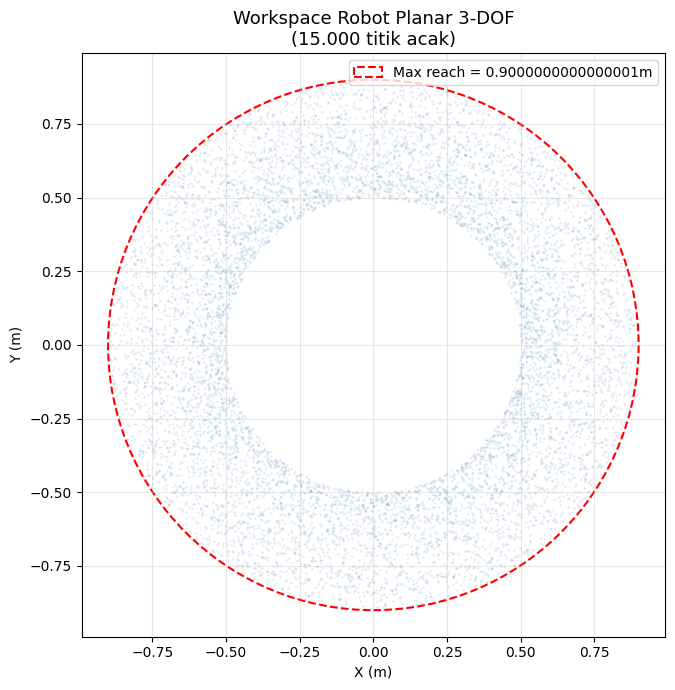

✅ Workspace tervisualisasi!


In [72]:
# ─── Generate Dataset ────────────────────────────────────────────────
np.random.seed(42)
N = 18000  # jumlah sampel

# Random sudut sendi
thetas = np.random.uniform(-JOINT_LIMIT, JOINT_LIMIT, size=(N, 3)).astype(np.float32)

# Hitung posisi end-effector via FK
ee_positions = np.array([get_end_effector(t) for t in thetas], dtype=np.float32)

# ─── Validasi Reachability Dataset ──────────────────────────────────
_, reach_mask = filter_reachable(ee_positions)
n_reachable = int(reach_mask.sum())
n_unreachable = N - n_reachable
print(f"✅ Dataset dibuat: {N} sampel")
print(f"   Reachable  : {n_reachable} ({n_reachable/N*100:.1f}%)")
print(f"   Unreachable: {n_unreachable} ({n_unreachable/N*100:.1f}%)")
if n_unreachable > 0:
    print(f"   ⚠️  {n_unreachable} sampel dibuang (tidak reachable)")
    ee_positions = ee_positions[reach_mask]
    thetas       = thetas[reach_mask]
    print(f"   ✅ Dataset bersih: {len(ee_positions)} sampel")
else:
    print("   ✅ Semua sampel reachable (expected, karena dari FK sampling)")
print(f"   Input  (theta): shape={thetas.shape}     → [θ1, θ2, θ3]")
print(f"   Output (EE pos): shape={ee_positions.shape} → [x, y]")

# ─── Visualisasi Workspace Robot ─────────────────────────────────────
fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(ee_positions[:,0], ee_positions[:,1],
           alpha=0.1, s=1, color='steelblue')
ax.set_title("Workspace Robot Planar 3-DOF\n(15.000 titik acak)", fontsize=13)
ax.set_xlabel("X (m)"); ax.set_ylabel("Y (m)")
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
circle = plt.Circle((0,0), MAX_REACH, fill=False, color='red',
                     linestyle='--', linewidth=1.5, label=f'Max reach = {MAX_REACH}m')
ax.add_patch(circle)
ax.legend(); plt.tight_layout(); plt.show()
print("✅ Workspace tervisualisasi!")


In [73]:
# ─── Split Dataset ───────────────────────────────────────────────────
from sklearn.model_selection import train_test_split

# X = posisi target (ee_positions), y = sudut sendi (thetas)
X_train, X_test, y_train, y_test = train_test_split(
    ee_positions, thetas, test_size=0.2, random_state=42)

print(f"Train: {X_train.shape[0]} sampel")
print(f"Test : {X_test.shape[0]} sampel")


Train: 7032 sampel
Test : 1758 sampel


---
## 🤖 Bagian 4: Pendekatan 1 — Machine Learning (Supervised)

**Ide:** Buat model regresi dari data (x,y) → (θ1,θ2,θ3)  
Model akan belajar memetakan posisi target ke sudut sendi.


In [74]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import make_scorer
import numpy as np
import time

# ─── Normalisasi ──────────────────────────────────────────────────────────────
scaler_X = StandardScaler()
X_train_s = scaler_X.fit_transform(X_train)
X_test_s  = scaler_X.transform(X_test)

# ─── Custom Scorer: mean EE position error ────────────────────────────────────
def ee_position_error(y_true, y_pred):
    ee_pred = np.array([get_end_effector(p) for p in y_pred])
    ee_true = np.array([get_end_effector(t) for t in y_true])
    errors  = np.linalg.norm(ee_pred - ee_true, axis=1)
    return -errors.mean()

ee_scorer = make_scorer(ee_position_error)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

print("=" * 60)
print("GridSearchCV - KNN")
print("=" * 60)

param_grid_knn = {
    "n_neighbors" : [3, 5, 10],
    "weights"     : ["uniform", "distance"],
    "metric"      : ["euclidean", "manhattan", "minkowski"],
    "p"           : [1, 2],
    "algorithm"   : ["auto", "ball_tree", "kd_tree"],
    "leaf_size"   : [20, 30, 40],
}

t0 = time.time()
gs_knn = GridSearchCV(
    estimator          = KNeighborsRegressor(n_jobs=-1),
    param_grid         = param_grid_knn,
    scoring            = ee_scorer,
    cv                 = cv,
    n_jobs             = -1,
    verbose            = 1,
    refit              = True,
    return_train_score = False,
)
gs_knn.fit(X_train_s, y_train)
t_gs_knn = time.time() - t0

best_knn      = gs_knn.best_estimator_
knn_pred      = best_knn.predict(X_test_s)
knn_ee        = np.array([get_end_effector(p) for p in knn_pred])
knn_err       = np.linalg.norm(knn_ee - X_test, axis=1)

print(f"Selesai dalam {t_gs_knn:.1f}s")
print(f"Best params  : {gs_knn.best_params_}")
print(f"CV EE error  : {-gs_knn.best_score_*100:.4f} cm")
print(f"Test EE error: {knn_err.mean()*100:.4f} cm (std {knn_err.std()*100:.4f} cm)")

print()
print("=" * 60)
print("GridSearchCV - Random Forest")
print("=" * 60)

param_grid_rf = {
    "n_estimators"      : [50, 100, 200],
    "max_depth"         : [None, 10, 20, 30],
    "min_samples_split" : [2, 5, 10],
    "min_samples_leaf"  : [1, 2, 4],
    "max_features"      : ["sqrt", "log2", None],
    "bootstrap"         : [True, False],
}

t0 = time.time()
gs_rf = GridSearchCV(
    estimator          = RandomForestRegressor(n_jobs=-1, random_state=42),
    param_grid         = param_grid_rf,
    scoring            = ee_scorer,
    cv                 = cv,
    n_jobs             = -1,
    verbose            = 1,
    refit              = True,
    return_train_score = False,
)
gs_rf.fit(X_train_s, y_train)
t_gs_rf = time.time() - t0

best_rf   = gs_rf.best_estimator_
rf_pred   = best_rf.predict(X_test_s)
rf_ee     = np.array([get_end_effector(p) for p in rf_pred])
rf_err    = np.linalg.norm(rf_ee - X_test, axis=1)

print(f"Selesai dalam {t_gs_rf:.1f}s")
print(f"Best params  : {gs_rf.best_params_}")
print(f"CV EE error  : {-gs_rf.best_score_*100:.4f} cm")
print(f"Test EE error: {rf_err.mean()*100:.4f} cm (std {rf_err.std()*100:.4f} cm)")

print()
print("=" * 60)
print("RINGKASAN HASIL TUNING")
print("=" * 60)
print(f"{'Model':<20} {'CV Error (cm)':<18} {'Test Error (cm)':<18} {'Waktu (s)'}")
print("-" * 60)
print(f"{'KNN':<20} {-gs_knn.best_score_*100:<18.4f} {knn_err.mean()*100:<18.4f} {t_gs_knn:.1f}")
print(f"{'Random Forest':<20} {-gs_rf.best_score_*100:<18.4f} {rf_err.mean()*100:<18.4f} {t_gs_rf:.1f}")

winner = "KNN" if knn_err.mean() < rf_err.mean() else "Random Forest"
print(f"\nModel terbaik: {winner}")

GridSearchCV - KNN
Fitting 5 folds for each of 324 candidates, totalling 1620 fits


KeyboardInterrupt: 

In [75]:
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
# ─── Normalisasi ─────────────────────────────────────────────────────
scaler_X = StandardScaler()
X_train_s = scaler_X.fit_transform(X_train)
X_test_s  = scaler_X.transform(X_test)

ml_results = {}

# ─── 1. KNN ───────────────────────────────────────────────────────────
print("🔵 Training KNN...")
t0 = time.time()
knn = KNeighborsRegressor(
    algorithm  = 'auto',
    leaf_size  = 20,
    metric     = 'manhattan',
    n_neighbors= 3,
    p          = 1,
    weights    = 'distance',
    n_jobs     = -1
)
knn.fit(X_train_s, y_train)
knn_pred = knn.predict(X_test_s)
t_knn = time.time() - t0

# Hitung error di end-effector (bukan di sudut)
knn_ee  = np.array([get_end_effector(p) for p in knn_pred])
knn_err = np.linalg.norm(knn_ee - X_test, axis=1)
ml_results['KNN'] = {'pred': knn_pred, 'ee_err': knn_err, 'time': t_knn}
print(f"   ✅ KNN — mean EE error: {knn_err.mean()*100:.2f} cm | time: {t_knn:.1f}s")

# ─── 2. Random Forest ─────────────────────────────────────────────────
print("🌲 Training Random Forest...")
t0 = time.time()
rf = RandomForestRegressor(n_estimators=200, n_jobs=-1, random_state=42)
rf.fit(X_train_s, y_train)
rf_pred = rf.predict(X_test_s)
t_rf = time.time() - t0

rf_ee  = np.array([get_end_effector(p) for p in rf_pred])
rf_err = np.linalg.norm(rf_ee - X_test, axis=1)
ml_results['Random Forest'] = {'pred': rf_pred, 'ee_err': rf_err, 'time': t_rf}
print(f"   ✅ RF  — mean EE error: {rf_err.mean()*100:.2f} cm | time: {t_rf:.1f}s")

print("🔴 Training SVM...")
t0 = time.time()

svm = MultiOutputRegressor(
    SVR(
        kernel  = 'rbf',
        C       = 500,
        epsilon = 0.00001,
        gamma   = 'scale',
    ),
    n_jobs=-1
)

svm.fit(X_train_s, y_train)
svm_pred = svm.predict(X_test_s)
t_svm = time.time() - t0

svm_ee  = np.array([get_end_effector(p) for p in svm_pred])
svm_err = np.linalg.norm(svm_ee - X_test, axis=1)
ml_results['SVM'] = {'pred': svm_pred, 'ee_err': svm_err, 'time': t_svm}
print(f"   ✅ SVM — mean EE error: {svm_err.mean()*100:.2f} cm | time: {t_svm:.1f}s")

🔵 Training KNN...
   ✅ KNN — mean EE error: 42.93 cm | time: 0.0s
🌲 Training Random Forest...
   ✅ RF  — mean EE error: 56.21 cm | time: 6.5s
🔴 Training SVM...
   ✅ SVM — mean EE error: 58.15 cm | time: 21.8s


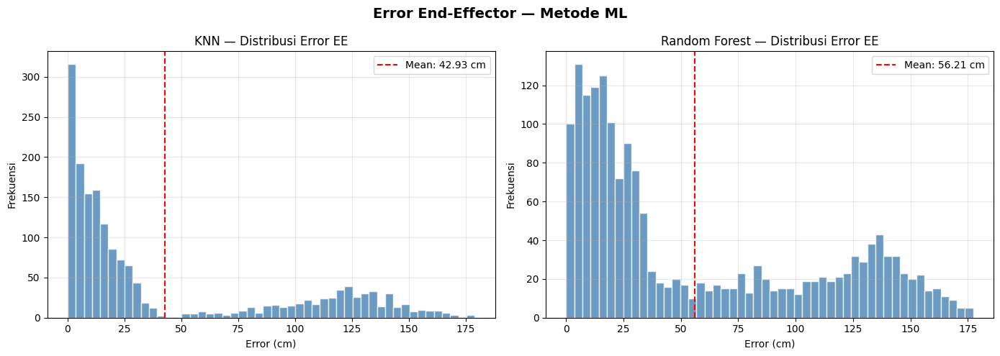

In [76]:
# ─── Visualisasi Error ML ─────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, (name, res) in zip(axes, ml_results.items()):
    ax.hist(res['ee_err']*100, bins=50, color='steelblue', edgecolor='white', alpha=0.8)
    ax.axvline(res['ee_err'].mean()*100, color='red', linestyle='--',
               label=f"Mean: {res['ee_err'].mean()*100:.2f} cm")
    ax.set_title(f"{name} — Distribusi Error EE", fontsize=12)
    ax.set_xlabel("Error (cm)"); ax.set_ylabel("Frekuensi")
    ax.legend(); ax.grid(True, alpha=0.3)

plt.suptitle("Error End-Effector — Metode ML", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


In [77]:
# ─── Cek Reachability Target Sebelum Prediksi (ML) ──────────────────
print("Cek reachability 5 sampel target test:")
for j, t in enumerate(X_test[:5]):
    r = is_reachable(t)
    d = np.linalg.norm(t)
    status = "YES" if r else "NO"
    print(f"   Target {j+1}: ({t[0]:.3f}, {t[1]:.3f}) | dist={d:.4f}m | Reachable: {status}")

# Filter X_test agar hanya berisi target reachable
X_test_r, y_test_r, mask_r = filter_reachable(X_test, y_test)
print(f"\nX_test reachable: {len(X_test_r)}/{len(X_test)} sampel digunakan untuk evaluasi")


Cek reachability 5 sampel target test:
   Target 1: (0.269, -0.785) | dist=0.8295m | Reachable: YES
   Target 2: (-0.405, -0.738) | dist=0.8421m | Reachable: YES
   Target 3: (0.197, 0.493) | dist=0.5307m | Reachable: YES
   Target 4: (-0.288, -0.420) | dist=0.5099m | Reachable: YES
   Target 5: (-0.678, -0.335) | dist=0.7565m | Reachable: YES

X_test reachable: 1758/1758 sampel digunakan untuk evaluasi


In [78]:
# ─── ANIMASI ML: Robot bergerak ke 10 target ─────────────────────────
def animate_ik(model_name, predict_fn, n_targets=10, color='steelblue'):
    """Animasi robot bergerak ke target menggunakan hasil prediksi IK."""
    np.random.seed(7)
    sample_idx = np.random.choice(len(X_test), n_targets, replace=False)
    targets = X_test[sample_idx]

    fig, ax = plt.subplots(figsize=(6, 6))

    def update(frame):
        ax.clear()
        target = targets[frame]
        theta_pred = predict_fn(target.reshape(1,-1))[0]
        ee_actual  = get_end_effector(theta_pred)
        err = np.linalg.norm(ee_actual - target) * 100

        plot_robot(ax, theta_pred, target=target,
                   title=f"{model_name}\nTarget ({target[0]:.2f}, {target[1]:.2f}) | Error: {err:.1f} cm",
                   color=color)
        ax.legend(loc='upper right', fontsize=8)

    ani = animation.FuncAnimation(fig, update, frames=n_targets,
                                  interval=800, repeat=True)
    plt.close()
    return ani

# KNN animation
ani_knn = animate_ik("KNN (k=5)",
                     lambda x: knn.predict(scaler_X.transform(x)),
                     color='steelblue')
print("▶️  Animasi KNN:")
HTML(ani_knn.to_jshtml())


▶️  Animasi KNN:


In [79]:
# Random Forest animation
ani_rf = animate_ik("Random Forest (100 trees)",
                    lambda x: rf.predict(scaler_X.transform(x)),
                    color='forestgreen')
print("▶️  Animasi Random Forest:")
HTML(ani_rf.to_jshtml())


▶️  Animasi Random Forest:


---
## 🧠 Bagian 5: Pendekatan 2 — Deep Learning (PyTorch MLP)

**Ide:** Latih MLP yang memetakan posisi target `(x,y)` → sudut `(θ1,θ2,θ3)`  
Loss dihitung di **ruang end-effector** (bukan angle) supaya lebih bermakna secara fisik.


In [80]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🖥️  Device: {device}")

# ─── MLP Architecture ─────────────────────────────────────────────────
class IKNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(2, 256), nn.BatchNorm1d(256), nn.ReLU(),
            nn.Linear(256, 512), nn.BatchNorm1d(512), nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(512, 512), nn.BatchNorm1d(512), nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(512, 256), nn.BatchNorm1d(256), nn.ReLU(),
            nn.Linear(256, 3),
        )
        # Output: sudut dalam [-π, π]
    def forward(self, x):
        out = self.net(x)
        return torch.tanh(out) * torch.pi  # clamp ke [-π, π]

model_dl = IKNet().to(device)
print(f"✅ Model: {sum(p.numel() for p in model_dl.parameters()):,} parameter")


🖥️  Device: cpu
✅ Model: 530,179 parameter


In [81]:
# ─── FK differentiable (PyTorch) ─────────────────────────────────────
def fk_torch(theta):
    """Differentiable FK untuk loss di ruang kartesian."""
    t1, t2, t3 = theta[:,0], theta[:,1], theta[:,2]
    x = (L1*torch.cos(t1)
       + L2*torch.cos(t1+t2)
       + L3*torch.cos(t1+t2+t3))
    y = (L1*torch.sin(t1)
       + L2*torch.sin(t1+t2)
       + L3*torch.sin(t1+t2+t3))
    return torch.stack([x, y], dim=1)

# ─── Dataset & DataLoader ─────────────────────────────────────────────
X_tr_t = torch.FloatTensor(X_train).to(device)
X_te_t = torch.FloatTensor(X_test).to(device)
y_tr_t = torch.FloatTensor(y_train).to(device)

train_ds = TensorDataset(X_tr_t, y_tr_t)
train_dl = DataLoader(train_ds, batch_size=512, shuffle=True)

# ─── Training Loop ────────────────────────────────────────────────────
optimizer = optim.Adam(model_dl.parameters(), lr=1e-3, weight_decay=1e-5)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=100)
EPOCHS = 100

train_losses, val_losses = [], []
print("🚀 Training DL model...")

for epoch in range(EPOCHS):
    model_dl.train()
    ep_loss = 0
    for xb, yb in train_dl:
        optimizer.zero_grad()
        pred_theta = model_dl(xb)
        pred_ee    = fk_torch(pred_theta)
        loss = nn.MSELoss()(pred_ee, xb)  # loss di ruang EE
        loss.backward()
        optimizer.step()
        ep_loss += loss.item()
    train_losses.append(ep_loss / len(train_dl))

    model_dl.eval()
    with torch.no_grad():
        val_pred_theta = model_dl(X_te_t)
        val_pred_ee    = fk_torch(val_pred_theta)
        val_loss = nn.MSELoss()(val_pred_ee, X_te_t).item()
    val_losses.append(val_loss)
    scheduler.step()

    if (epoch+1) % 20 == 0:
        print(f"   Epoch {epoch+1:3d}/{EPOCHS} | Train: {train_losses[-1]:.6f} | Val: {val_loss:.6f}")

print("✅ Training selesai!")


🚀 Training DL model...
   Epoch  20/100 | Train: 0.021630 | Val: 0.017223
   Epoch  40/100 | Train: 0.013714 | Val: 0.011452
   Epoch  60/100 | Train: 0.010167 | Val: 0.009314
   Epoch  80/100 | Train: 0.008508 | Val: 0.007786
   Epoch 100/100 | Train: 0.007919 | Val: 0.005767
✅ Training selesai!


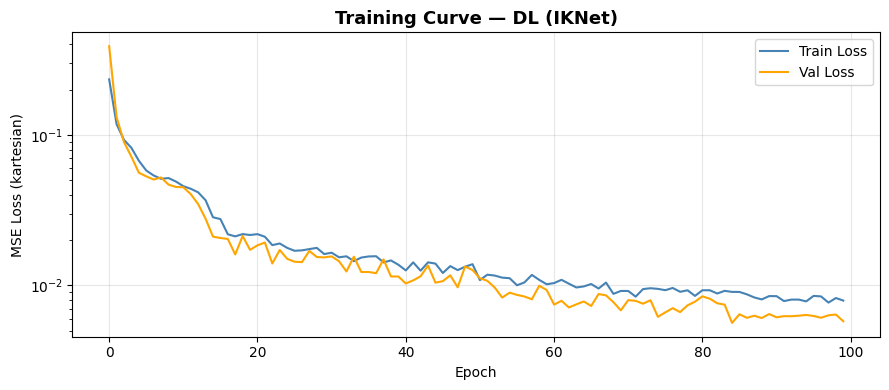

✅ DL — mean EE error: 4.85 cm


In [82]:
# ─── Training Curve ───────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(train_losses, label='Train Loss', color='steelblue')
ax.plot(val_losses,   label='Val Loss',   color='orange')
ax.set_title("Training Curve — DL (IKNet)", fontsize=13, fontweight='bold')
ax.set_xlabel("Epoch"); ax.set_ylabel("MSE Loss (kartesian)")
ax.legend(); ax.grid(True, alpha=0.3)
ax.set_yscale('log')
plt.tight_layout(); plt.show()

# Hitung error DL
model_dl.eval()
with torch.no_grad():
    dl_pred = model_dl(X_te_t).cpu().numpy()

dl_ee  = np.array([get_end_effector(p) for p in dl_pred])
dl_err = np.linalg.norm(dl_ee - X_test, axis=1)
print(f"✅ DL — mean EE error: {dl_err.mean()*100:.2f} cm")


In [83]:
# ─── Cek Reachability Target Sebelum Prediksi (DL) ──────────────────
print("Validasi reachability untuk evaluasi DL...")
# Gunakan X_test_r (sudah difilter) untuk konsistensi
print(f"   Evaluasi menggunakan {len(X_test_r)} target reachable")
import torch as _torch
X_te_r_t = _torch.FloatTensor(X_test_r).to(device)


Validasi reachability untuk evaluasi DL...
   Evaluasi menggunakan 1758 target reachable


In [84]:
# ─── ANIMASI DL: Robot bergerak ke target ─────────────────────────────
def dl_predict(xy):
    model_dl.eval()
    with torch.no_grad():
        t = torch.FloatTensor(xy).to(device)
        return model_dl(t).cpu().numpy()

ani_dl = animate_ik("Deep Learning (MLP PyTorch)",
                    dl_predict, color='darkorange')
print("▶️  Animasi Deep Learning:")
HTML(ani_dl.to_jshtml())


▶️  Animasi Deep Learning:


---
## 🕹️ Bagian 6: Pendekatan 3 — Reinforcement Learning (Gymnasium + PPO)

**Ide:** Agent belajar sendiri menggerakkan sendi robot untuk menjangkau target.  
Tidak butuh dataset — agent belajar dari **reward** berdasarkan seberapa dekat end-effector ke target.

**Reward:** `-distance(EE, target)` + bonus `+10` kalau berhasil (<2 cm)


In [85]:
import gymnasium as gym
from gymnasium import spaces

# ─── Joint Limits Realistis ───────────────────────────────────────────
# θ1: bebas berputar (shoulder)
# θ2: elbow, hindari lipatan ekstrem
# θ3: wrist, range lebih sempit
JOINT_LIMITS_LOW  = np.array([-np.pi,      -2*np.pi/3, -np.pi/2], dtype=np.float32)
JOINT_LIMITS_HIGH = np.array([ np.pi,       2*np.pi/3,  np.pi/2], dtype=np.float32)

class PlanarRobot3DOFEnv(gym.Env):
    """Custom Gymnasium environment untuk robot planar 3-DOF."""
    metadata = {"render_modes": ["rgb_array"], "render_fps": 30}

    def __init__(self, render_mode=None):
        super().__init__()
        self.render_mode = render_mode
        self.max_steps   = 200
        self.goal_thresh = 0.02  # 2 cm

        # Observation: [θ1,θ2,θ3, dθ1,dθ2,dθ3, x_target, y_target]
        obs_high = np.concatenate([
            JOINT_LIMITS_HIGH,
            np.array([5.0, 5.0, 5.0], dtype=np.float32),
            np.array([MAX_REACH, MAX_REACH], dtype=np.float32)
        ])
        self.observation_space = spaces.Box(-obs_high, obs_high, dtype=np.float32)

        # Action: delta sudut per sendi (lebih ketat untuk θ2 & θ3)
        act_high = np.array([0.15, 0.10, 0.08], dtype=np.float32)
        self.action_space = spaces.Box(-act_high, act_high, dtype=np.float32)
        self._reset_state()

    def _reset_state(self):
        # Inisialisasi di tengah joint range (bukan zero) untuk variasi
        self.theta  = np.random.uniform(
            JOINT_LIMITS_LOW * 0.3, JOINT_LIMITS_HIGH * 0.3
        ).astype(np.float32)
        self.dtheta = np.zeros(3, dtype=np.float32)
        self.steps  = 0
        # Generate target reachable via FK sampling
        while True:
          target_angles = np.random.uniform(-np.pi, np.pi, 3).astype(np.float32)
          self.target   = get_end_effector(target_angles).astype(np.float32)
          if is_reachable(self.target):
            break
        # # Safety check reachability
        # assert is_reachable(self.target), \
        #     f"Target {self.target} TIDAK reachable! dist={np.linalg.norm(self.target):.4f} > MAX_REACH={MAX_REACH}"

    def _get_obs(self):
        return np.concatenate([self.theta, self.dtheta, self.target]).astype(np.float32)

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        if seed is not None:
            np.random.seed(seed)
        self._reset_state()
        return self._get_obs(), {}

    def step(self, action):
        # Clip action per joint sesuai batas masing-masing
        act_high = np.array([0.15, 0.10, 0.08], dtype=np.float32)
        delta = np.clip(action, -act_high, act_high).astype(np.float32)

        # Update theta dengan joint limits realistis
        self.theta  = np.clip(self.theta + delta,
                              JOINT_LIMITS_LOW, JOINT_LIMITS_HIGH).astype(np.float32)
        self.dtheta = delta

        ee   = get_end_effector(self.theta)
        dist = float(np.linalg.norm(ee - self.target))

        # ── Reward shaping ─────────────────────────────────────────────
        # 1. Proximity reward
        reward = -dist

        # 2. Penalti konfigurasi degenerate:
        #    - Hindari θ2, θ3 yang terlalu besar (lipatan ekstrem)
        angle_penalty = 0.005 * float(np.sum(self.theta[1:]**2))
        reward -= angle_penalty

        # 3. Bonus sukses
        terminated = False
        if dist < self.goal_thresh:
            reward += 10.0
            terminated = True

        self.steps += 1
        truncated = self.steps >= self.max_steps
        return self._get_obs(), reward, terminated, truncated, {"dist": dist}

    def render(self):
        fig, ax = plt.subplots(figsize=(5, 5))
        plot_robot(ax, self.theta, target=self.target,
                   title="RL Agent", color='purple')
        fig.canvas.draw()
        img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        img = img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        plt.close(fig)
        return img

print("Joint limits:")
print(f"  theta1 (shoulder): [{np.degrees(JOINT_LIMITS_LOW[0]):.0f}, {np.degrees(JOINT_LIMITS_HIGH[0]):.0f}] deg")
print(f"  theta2 (elbow)   : [{np.degrees(JOINT_LIMITS_LOW[1]):.0f}, {np.degrees(JOINT_LIMITS_HIGH[1]):.0f}] deg")
print(f"  theta3 (wrist)   : [{np.degrees(JOINT_LIMITS_LOW[2]):.0f}, {np.degrees(JOINT_LIMITS_HIGH[2]):.0f}] deg")
print("Environment terdefinisi!")
from gymnasium.utils.env_checker import check_env
env_test = PlanarRobot3DOFEnv()
check_env(env_test, warn=True)
print("check_env passed!")


Joint limits:
  theta1 (shoulder): [-180, 180] deg
  theta2 (elbow)   : [-120, 120] deg
  theta3 (wrist)   : [-90, 90] deg
Environment terdefinisi!
check_env passed!


In [86]:
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.callbacks import EvalCallback, BaseCallback
import os

class RewardLoggerCallback(BaseCallback):
    """
    Callback untuk mencatat mean reward dan mean episode length
    setiap `log_freq` timestep — digunakan untuk plot learning curve.
    """
    def __init__(self, log_freq=5000, verbose=0):
        super().__init__(verbose)
        self.log_freq       = log_freq
        self.timesteps_log  = []
        self.mean_rewards   = []
        self.mean_ep_lens   = []
        self._ep_rewards    = []
        self._ep_lens       = []
        self._cur_ep_reward = None
        self._cur_ep_len    = None

    def _on_training_start(self):
        self._cur_ep_reward = np.zeros(self.training_env.num_envs)
        self._cur_ep_len    = np.zeros(self.training_env.num_envs, dtype=int)

    def _on_step(self):
        rewards = self.locals["rewards"]
        dones   = self.locals["dones"]
        self._cur_ep_reward += rewards
        self._cur_ep_len    += 1

        for idx, done in enumerate(dones):
            if done:
                self._ep_rewards.append(self._cur_ep_reward[idx])
                self._ep_lens.append(self._cur_ep_len[idx])
                self._cur_ep_reward[idx] = 0
                self._cur_ep_len[idx]    = 0

        if self.n_calls % self.log_freq == 0 and len(self._ep_rewards) > 0:
            mean_r   = float(np.mean(self._ep_rewards[-50:]))
            mean_len = float(np.mean(self._ep_lens[-50:]))
            self.timesteps_log.append(self.num_timesteps)
            self.mean_rewards.append(mean_r)
            self.mean_ep_lens.append(mean_len)
            print(f"   ⏱  {self.num_timesteps:>8,} steps | "
                  f"mean_reward: {mean_r:7.3f} | mean_ep_len: {mean_len:.1f}")
        return True

# ─── Training PPO ─────────────────────────────────────────────────────
vec_env  = make_vec_env(PlanarRobot3DOFEnv, n_envs=16)
eval_env = make_vec_env(PlanarRobot3DOFEnv, n_envs=1)

model_rl = PPO(
    "MlpPolicy", vec_env,
    learning_rate=3e-4,
    n_steps=1024, batch_size=256, n_epochs=10,
    gamma=0.99, gae_lambda=0.95,
    clip_range=0.2, ent_coef=0.01,
    policy_kwargs=dict(net_arch=dict(pi=[256,256], vf=[256,256])),
    verbose=0
)

eval_cb = EvalCallback(eval_env, eval_freq=20000, n_eval_episodes=10,
                       best_model_save_path="./rl_best/", verbose=0)

reward_logger = RewardLoggerCallback(log_freq=5000)
print("🚀 Training PPO (800k timesteps)...")
model_rl.learn(total_timesteps=800_000,
               callback=[eval_cb, reward_logger])
print("✅ Training RL selesai!")


🚀 Training PPO (800k timesteps)...
   ⏱    80,000 steps | mean_reward: -125.958 | mean_ep_len: 188.3
   ⏱   160,000 steps | mean_reward: -48.089 | mean_ep_len: 156.5
   ⏱   240,000 steps | mean_reward: -39.580 | mean_ep_len: 140.8
   ⏱   320,000 steps | mean_reward: -37.879 | mean_ep_len: 141.8
   ⏱   400,000 steps | mean_reward: -33.762 | mean_ep_len: 141.5
   ⏱   480,000 steps | mean_reward: -25.266 | mean_ep_len: 119.3
   ⏱   560,000 steps | mean_reward: -32.101 | mean_ep_len: 139.9
   ⏱   640,000 steps | mean_reward: -25.282 | mean_ep_len: 124.7
   ⏱   720,000 steps | mean_reward: -22.081 | mean_ep_len: 119.7
   ⏱   800,000 steps | mean_reward: -30.388 | mean_ep_len: 144.6
✅ Training RL selesai!


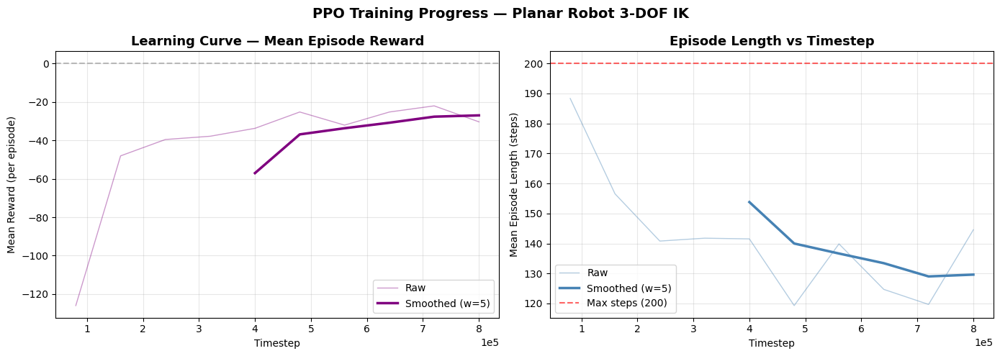

Reward awal  (avg 10 pertama): -42.039
Reward akhir (avg 10 terakhir): -42.039
Peningkatan  : +0.000


In [87]:
# ─── Visualisasi Learning Curve (Reward vs Timestep) ─────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# ── Plot 1: Mean Episode Reward ───────────────────────────────────────
ax = axes[0]
ts  = np.array(reward_logger.timesteps_log)
rew = np.array(reward_logger.mean_rewards)

ax.plot(ts, rew, color='purple', alpha=0.4, linewidth=1, label='Raw')

# Smoothing dengan rolling average
if len(rew) >= 10:
    window = max(5, len(rew) // 10)
    smooth = np.convolve(rew, np.ones(window)/window, mode='valid')
    ts_smooth = ts[window-1:]
    ax.plot(ts_smooth, smooth, color='purple', linewidth=2.5, label=f'Smoothed (w={window})')

ax.axhline(0, color='gray', linestyle='--', alpha=0.5)
ax.set_title("Learning Curve — Mean Episode Reward", fontsize=13, fontweight='bold')
ax.set_xlabel("Timestep"); ax.set_ylabel("Mean Reward (per episode)")
ax.legend(); ax.grid(True, alpha=0.3)
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

# ── Plot 2: Mean Episode Length ───────────────────────────────────────
ax2 = axes[1]
ep_len = np.array(reward_logger.mean_ep_lens)

ax2.plot(ts, ep_len, color='steelblue', alpha=0.4, linewidth=1, label='Raw')

if len(ep_len) >= 10:
    smooth_len = np.convolve(ep_len, np.ones(window)/window, mode='valid')
    ax2.plot(ts_smooth, smooth_len, color='steelblue', linewidth=2.5,
             label=f'Smoothed (w={window})')

ax2.axhline(200, color='red', linestyle='--', alpha=0.6, label='Max steps (200)')
ax2.set_title("Episode Length vs Timestep", fontsize=13, fontweight='bold')
ax2.set_xlabel("Timestep"); ax2.set_ylabel("Mean Episode Length (steps)")
ax2.legend(); ax2.grid(True, alpha=0.3)
ax2.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.suptitle("PPO Training Progress — Planar Robot 3-DOF IK",
             fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

# ── Ringkasan learning ────────────────────────────────────────────────
if len(rew) > 0:
    print(f"Reward awal  (avg 10 pertama): {np.mean(rew[:10]):.3f}")
    print(f"Reward akhir (avg 10 terakhir): {np.mean(rew[-10:]):.3f}")
    improvement = np.mean(rew[-10:]) - np.mean(rew[:10])
    print(f"Peningkatan  : {improvement:+.3f}")


In [88]:
# ─── Evaluasi RL ──────────────────────────────────────────────────────
eval_single = PlanarRobot3DOFEnv()
successes, distances = [], []

model_rl.load('./rl_best/best_model.zip')
np.random.seed(99)
for _ in range(200):
    obs, _ = eval_single.reset()
    for _ in range(200):
        action, _ = model_rl.predict(obs, deterministic=True)
        obs, reward, terminated, truncated, info = eval_single.step(action)
        if terminated or truncated:
            break
    distances.append(info['dist'])
    successes.append(info['dist'] < 0.02)

print(f"✅ RL Success rate : {np.mean(successes)*100:.1f}%")
print(f"✅ RL Mean EE error: {np.mean(distances)*100:.2f} cm")
rl_errors = np.array(distances)


✅ RL Success rate : 31.5%
✅ RL Mean EE error: 11.33 cm


In [89]:
# ─── ANIMASI RL: Agent mencapai target step-by-step ──────────────────
def animate_rl(n_episodes=8):
    """Animasi episode RL: pergerakan robot frame per frame."""
    # Kumpulkan trajectory dari beberapa episode
    trajectories = []
    env_anim = PlanarRobot3DOFEnv()
    np.random.seed(55)
    for ep in range(n_episodes):
        obs, _ = env_anim.reset(seed=ep*10)
        target = env_anim.target.copy()
        traj = []
        for _ in range(80):
            action, _ = model_rl.predict(obs, deterministic=True)
            obs, _, terminated, truncated, info = env_anim.step(action)
            traj.append((env_anim.theta.copy(), target.copy(), info['dist']))
            if terminated or truncated:
                break
        trajectories.append(traj)

    # Flatten: semua episode diputar berurutan
    all_frames = []
    for traj in trajectories:
        # Ambil setiap 3 frame supaya animasi tidak terlalu lambat
        all_frames.extend(traj[::3])
        # Tahan frame terakhir 5x
        all_frames.extend([traj[-1]] * 5)

    fig, ax = plt.subplots(figsize=(6, 6))

    def update(i):
        ax.clear()
        theta, target, dist = all_frames[i]
        ee = get_end_effector(theta)
        success = dist < 0.02
        color = 'green' if success else 'purple'
        status = "✅ BERHASIL!" if success else f"dist: {dist*100:.1f} cm"
        plot_robot(ax, theta, target=target,
                   title=f"RL Agent (PPO)\n{status}", color=color)
        ax.legend(loc='upper right', fontsize=8)

    ani = animation.FuncAnimation(fig, update, frames=len(all_frames),
                                  interval=120, repeat=True)
    plt.close()
    return ani

ani_rl = animate_rl()
print("▶️  Animasi Reinforcement Learning:")
HTML(ani_rl.to_jshtml())


▶️  Animasi Reinforcement Learning:


---
## 📊 Bagian 7: Perbandingan Ketiga Metode

In [90]:
# ─── Demo: Cek Target Manual Sebelum IK ─────────────────────────────
def predict_ik_safe(target_xy, method='dl'):
    """
    Prediksi IK dengan validasi reachability terlebih dahulu.
    method: 'knn', 'rf', 'svm', 'dl'
    """
    target = np.array(target_xy, dtype=np.float32)
    dist   = np.linalg.norm(target)

    if not is_reachable(target):
        print(f"TIDAK REACHABLE: ({target[0]:.3f}, {target[1]:.3f})")
        print(f"   Jarak dari origin: {dist:.4f} m > MAX_REACH: {MAX_REACH} m")
        return None

    print(f"REACHABLE: ({target[0]:.3f}, {target[1]:.3f}) | dist={dist:.4f} m")

    if method == 'knn':
        pred = knn.predict(scaler_X.transform(target.reshape(1,-1)))[0]
    elif method == 'rf':
        pred = rf.predict(scaler_X.transform(target.reshape(1,-1)))[0]
    elif method == 'svm':
        pred = svm.predict(scaler_X.transform(target.reshape(1,-1)))[0]
    else:  # dl (default)
        import torch
        model_dl.eval()
        with torch.no_grad():
            t = torch.FloatTensor(target.reshape(1,-1)).to(device)
            pred = model_dl(t).cpu().numpy()[0]

    ee  = get_end_effector(pred)
    err = np.linalg.norm(ee - target) * 100
    print(f"   Prediksi theta : [{pred[0]:.3f}, {pred[1]:.3f}, {pred[2]:.3f}] rad")
    print(f"   EE aktual      : ({ee[0]:.3f}, {ee[1]:.3f}) m")
    print(f"   Error EE       : {err:.2f} cm")
    return pred

# ─── Uji dengan berbagai target ──────────────────────────────────────
print("=" * 55)
print("Target REACHABLE:")
for method in ['knn', 'rf', 'svm', 'dl']:              # [+] loop semua method
    print(f"\n── Method: {method.upper()} ──")
    predict_ik_safe((0.5, 0.3),  method=method)
    print()
    predict_ik_safe((0.7, -0.4), method=method)

print()
print("=" * 55)
print("Target TIDAK REACHABLE:")
predict_ik_safe((1.0, 0.5),  method='dl')
predict_ik_safe((-0.8, 0.7), method='dl')

Target REACHABLE:

── Method: KNN ──
REACHABLE: (0.500, 0.300) | dist=0.5831 m
   Prediksi theta : [0.198, 0.618, -0.457] rad
   EE aktual      : (0.751, 0.436) m
   Error EE       : 28.56 cm

REACHABLE: (0.700, -0.400) | dist=0.8062 m
   Prediksi theta : [-0.807, 0.236, 0.328] rad
   EE aktual      : (0.766, -0.432) m
   Error EE       : 7.37 cm

── Method: RF ──
REACHABLE: (0.500, 0.300) | dist=0.5831 m
   Prediksi theta : [0.257, 0.513, -0.335] rad
   EE aktual      : (0.753, 0.456) m
   Error EE       : 29.68 cm

REACHABLE: (0.700, -0.400) | dist=0.8062 m
   Prediksi theta : [-0.713, 0.151, 0.232] rad
   EE aktual      : (0.774, -0.441) m
   Error EE       : 8.43 cm

── Method: SVM ──
REACHABLE: (0.500, 0.300) | dist=0.5831 m
   Prediksi theta : [0.569, -0.143, -0.110] rad
   EE aktual      : (0.818, 0.366) m
   Error EE       : 32.48 cm

REACHABLE: (0.700, -0.400) | dist=0.8062 m
   Prediksi theta : [-0.454, -0.045, 0.133] rad
   EE aktual      : (0.811, -0.386) m
   Error EE     

In [91]:
# ─── Tabel Ringkasan ──────────────────────────────────────────────────
import pandas as pd

summary = {
    'Metode': [
        'KNN',
        'Random Forest',
        'SVM',
        'Deep Learning (MLP)',
        'RL (PPO)',
    ],
    'Mean Error (cm)': [
        round(ml_results['KNN']['ee_err'].mean()*100, 2),
        round(ml_results['Random Forest']['ee_err'].mean()*100, 2),
        round(ml_results['SVM']['ee_err'].mean()*100, 2),
        round(dl_err.mean()*100, 2),
        round(rl_errors.mean()*100, 2),
    ],
    'Std Error (cm)': [
        round(ml_results['KNN']['ee_err'].std()*100, 2),
        round(ml_results['Random Forest']['ee_err'].std()*100, 2),
        round(ml_results['SVM']['ee_err'].std()*100, 2),
        round(dl_err.std()*100, 2),
        round(rl_errors.std()*100, 2),
    ],
    'Butuh Dataset': [
        '✅ Ya',
        '✅ Ya',
        '✅ Ya',
        '✅ Ya',
        '❌ Tidak',
    ],
    'Training Time': [
        f"{ml_results['KNN']['time']:.1f}s",
        f"{ml_results['Random Forest']['time']:.1f}s",
        f"{ml_results['SVM']['time']:.1f}s",
        f"~{EPOCHS} epoch",
        '200k steps',
    ],
    'Kelebihan': [
        'Simpel, cepat',
        'Robust, stabil',
        'Efektif data kecil',
        'Akurat, generalisasi',
        'Adaptif, no dataset',
    ]
}

df = pd.DataFrame(summary)

# Highlight model terbaik
best_idx = df['Mean Error (cm)'].idxmin()
print("=" * 75)
print("RINGKASAN PERBANDINGAN MODEL")
print("=" * 75)
print(df.to_string(index=False))
print("=" * 75)
print(f"🏆 Model terbaik: {df.loc[best_idx, 'Metode']} "
      f"(error: {df.loc[best_idx, 'Mean Error (cm)']} cm)")

RINGKASAN PERBANDINGAN MODEL
             Metode  Mean Error (cm)  Std Error (cm) Butuh Dataset Training Time            Kelebihan
                KNN            42.93           51.00          ✅ Ya          0.0s        Simpel, cepat
      Random Forest            56.21           52.39          ✅ Ya          6.5s       Robust, stabil
                SVM            58.15           46.52          ✅ Ya         21.8s   Efektif data kecil
Deep Learning (MLP)             4.85            9.58          ✅ Ya    ~100 epoch Akurat, generalisasi
           RL (PPO)            11.33           11.19       ❌ Tidak    200k steps  Adaptif, no dataset
🏆 Model terbaik: Deep Learning (MLP) (error: 4.85 cm)


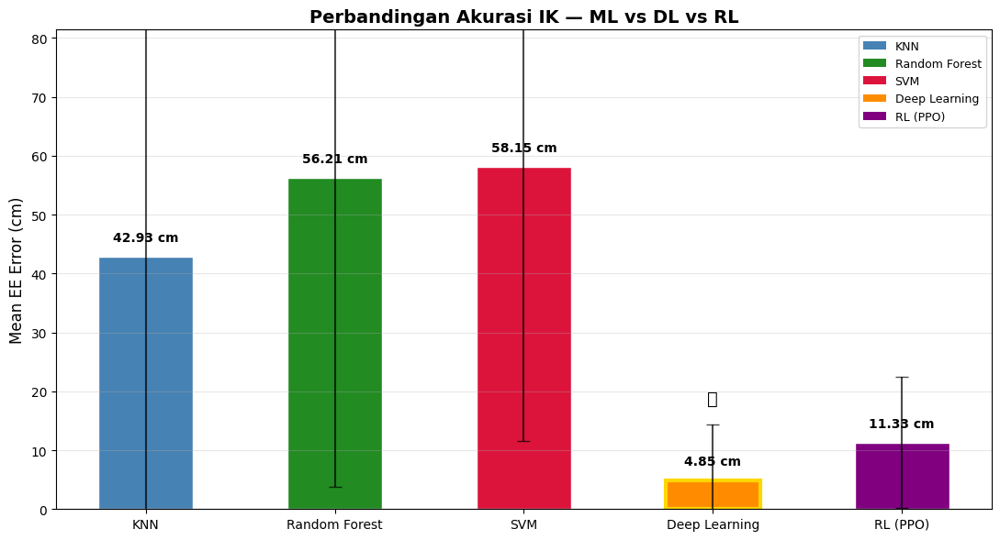

In [92]:
# ─── Bar Chart Perbandingan Error ────────────────────────────────────
labels = ['KNN', 'Random Forest', 'SVM', 'Deep Learning', 'RL (PPO)']
errors = [
    ml_results['KNN']['ee_err'].mean()*100,
    ml_results['Random Forest']['ee_err'].mean()*100,
    ml_results['SVM']['ee_err'].mean()*100,
    dl_err.mean()*100,
    rl_errors.mean()*100,
]
stds = [
    ml_results['KNN']['ee_err'].std()*100,
    ml_results['Random Forest']['ee_err'].std()*100,
    ml_results['SVM']['ee_err'].std()*100,
    dl_err.std()*100,
    rl_errors.std()*100,
]
colors = ['steelblue', 'forestgreen', 'crimson', 'darkorange', 'purple']

fig, ax = plt.subplots(figsize=(11, 6))
bars = ax.bar(labels, errors, color=colors, edgecolor='white', width=0.5,
              yerr=stds, capsize=5, error_kw={'elinewidth':1.5, 'alpha':0.7})

# Label nilai di atas bar
for bar, err in zip(bars, errors):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(stds)*0.05,
            f'{err:.2f} cm', ha='center', fontsize=10, fontweight='bold')

# Highlight model terbaik
best_idx = errors.index(min(errors))
bars[best_idx].set_edgecolor('gold')
bars[best_idx].set_linewidth(3)
ax.text(bars[best_idx].get_x() + bars[best_idx].get_width()/2,
        bars[best_idx].get_height() + max(stds)*0.25,
        '🏆', ha='center', fontsize=14)

ax.set_ylabel("Mean EE Error (cm)", fontsize=12)
ax.set_title("Perbandingan Akurasi IK — ML vs DL vs RL", fontsize=14, fontweight='bold')
ax.grid(True, axis='y', alpha=0.3)
ax.set_ylim(0, max(errors)*1.4)

# Legend keterangan
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=c, label=l) for c, l in zip(colors, labels)]
ax.legend(handles=legend_elements, loc='upper right', fontsize=9)

plt.tight_layout()
plt.show()

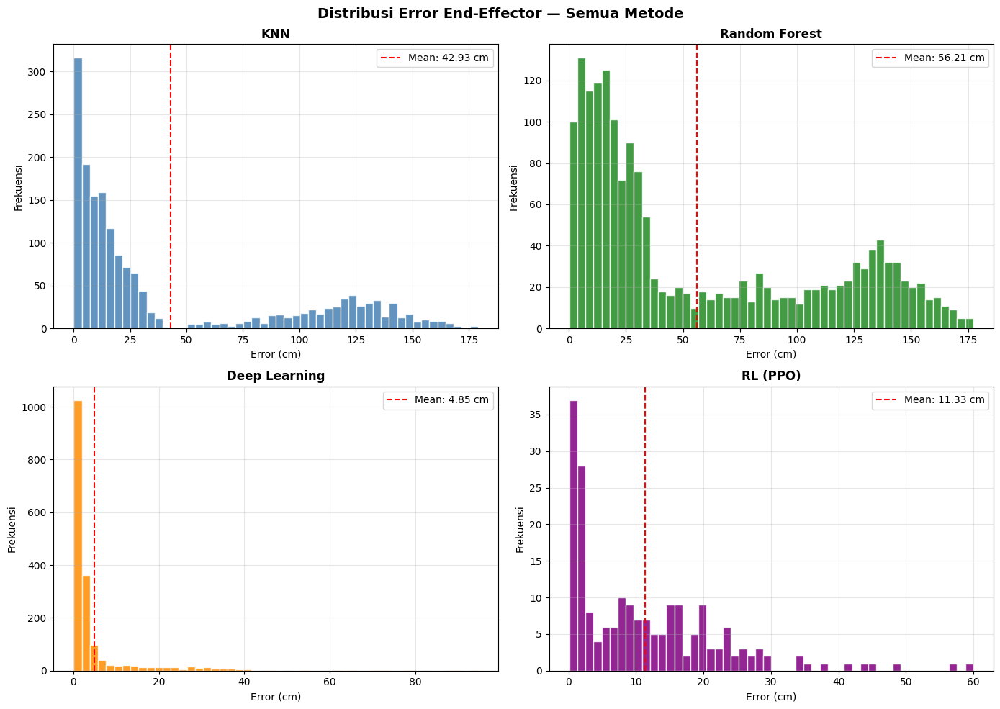

In [93]:
# ─── Distribusi Error Semua Metode ───────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

all_errs = [
    ('KNN',           ml_results['KNN']['ee_err']*100,           'steelblue'),
    ('Random Forest', ml_results['Random Forest']['ee_err']*100, 'forestgreen'),
    ('Deep Learning', dl_err*100,                                'darkorange'),
    ('RL (PPO)',       rl_errors*100,                             'purple'),
]
for ax, (name, errs, c) in zip(axes, all_errs):
    ax.hist(errs, bins=50, color=c, edgecolor='white', alpha=0.85)
    ax.axvline(errs.mean(), color='red', linestyle='--',
               label=f"Mean: {errs.mean():.2f} cm")
    ax.set_title(f"{name}", fontsize=12, fontweight='bold')
    ax.set_xlabel("Error (cm)"); ax.set_ylabel("Frekuensi")
    ax.legend(); ax.grid(True, alpha=0.3)

plt.suptitle("Distribusi Error End-Effector — Semua Metode",
             fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


---
## 📝 Kesimpulan & Diskusi

### Kapan Menggunakan Metode Apa?

| Kondisi | Rekomendasi |
|---------|-------------|
| Dataset besar tersedia, butuh hasil cepat | **Random Forest / KNN** |
| Butuh akurasi tinggi, punya GPU | **Deep Learning (MLP)** |
| Tidak ada dataset, lingkungan dinamis | **Reinforcement Learning** |
| Real-time control sederhana | **KNN** |
| Robot dengan obstacle/constraints | **RL** |

### Pertanyaan Diskusi
1. Mengapa DL lebih akurat dari KNN meskipun datanya sama?
KNN hanya "mencari tetangga terdekat" tanpa belajar pola. DL membangun model matematis yang memahami hubungan kompleks antara posisi dan sudut joint, sehingga lebih akurat terutama di area yang datanya jarang.

2. Mengapa RL tidak butuh dataset tetapi training-nya lebih lama?
karena RL belajar dari trial and error sendiri dengan reward dan punishment dari policy yang ditentukan.

3. Bagaimana menambahkan **obstacle avoidance** pada pendekatan RL?
Tambahkan penalti pada reward jika robot menabrak obstacle. Misalny reward normal jika mencapai target dan reward dikurangi jika posisi joint melewati area obstacle, dengan begitu robot akan belajar sendiri untuk memaksimalkan reward

4. Apa kelemahan supervised learning (ML/DL) untuk IK pada konfigurasi baru?
ML/DL hanya bisa memprediksi berdasarkan data yang pernah dilihat saat training. Jika panjang link berubah, ada joint baru, atau workspace berbeda, model lama tidak bisa dipakai dan harus ditraining ulang dari awal dengan dataset baru.

### Tugas Praktikum
- Ubah panjang link menjadi `[0.5, 0.4, 0.3]` dan bandingkan hasilnya
- Optimasi metode machine learning dengan menggunakan metode yang ada atau yang lain

---
*Selamat belajar! 🦾🤖*
